<a id="0"></a> <br>
 # Table of Contents  
1. [Topic classification](#1)     
    1. [Deliverables](#5) 
1. [Classifier](#2) 
    1. [Zero Shot Prediction](#6)
    1. [Data Preparation](#7)
        1.[Get labeled data](#14)
        1.[Fix the issue of lack of laezel images](#15)
        1.[Build up training/val dataset](#16)
        1.[Extract embedding for new laezel images](#17)
    1. [Logistic regression](#8)
    1. [Simple Feed-forward NN](#9)
        1. [One additional layer](#18)
        1. [Two additional layer](#19)
     
1. [Evaluation](#3) 
    1. [Test dataset check](#10)
    1. [Zero shot performance](#11)
    1. [Logistic regression performance](#12)
    1. [Feed-forward NN performance](#13)
        1. [one layer model](#20)
        1. [two layers model](#21)

1. [Conclusion](#4)

<a id="1"></a> 
# Topic classification

DeviantArt organizes deviations by topic, for example: https://www.deviantart.com/?topic=pokemon

Your task is to classify submission that match one of three new topics Mario, Frieren and Lae'zel (examples below).

Along with the notebook, you'll find a dataset consisting of the following files:
- `images.tar`: a sample of images from DeviantArt
- `embeddings.npy`: CLIP embeddings for the same images
- `test_set.csv`: a set of test labels for 100 images for three different characters

Code to load the images, embeddings and test set is included below.
<a id="5"></a> 
## Deliverables

1. Implement a simple classifier for the three characters Mario, Frieren and Lae'zel based on the provided data.
2. Evaluate your classifier on the provided test set.
3. Comment on your approach and any considerations you made.

You may use any libraries and models that you see fit. Include `pip` calls to install them or code to download them in the notebook.

_You have permission to use this dataset only for the purposes of completing this hiring exercise. In particular, you may not use the dataset, or any model trained using the dataset, for any purpose other than communicating with employees of DeviantArt regarding your potential employment with DeviantArt._


In [1]:
! pip install numpy pandas pillow jinja2

In [11]:
import base64
import tarfile

import numpy as np
import pandas as pd
from PIL import Image

In [12]:
tar = tarfile.open('images.tar')

def get_image(idx):
    return Image.open(tar.extractfile(f"{idx}.jpg"))

def embed_image(idx):
    image_base64 = base64.b64encode(tar.extractfile(f"{idx}.jpg").read()).decode('ascii')
    return f'<img src="data:image/jpeg;base64,{image_base64}" />'

,Mario,Frieren,Lae'zel
0,,,

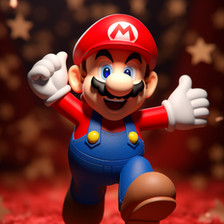
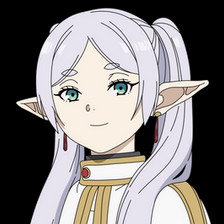
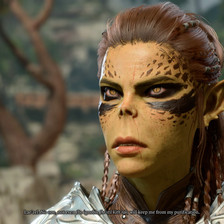

In [4]:
# These are different characters we want to classify:

characters = ["Mario", "Frieren", "Lae'zel"]
examples = [56340, 30180, 49582]

pd.DataFrame([examples], columns=characters).style.format(embed_image)

,0,1,2,3,4
0,,,,,
1,,,,,
2,,,,,
3,,,,,
4,,,,,

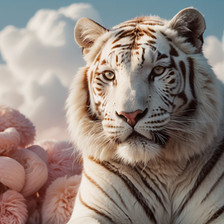
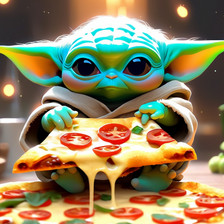
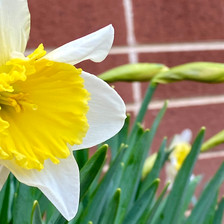
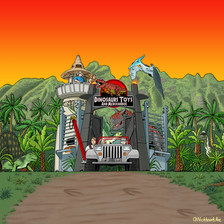
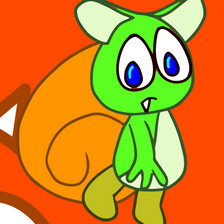
...
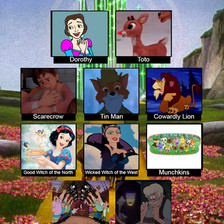
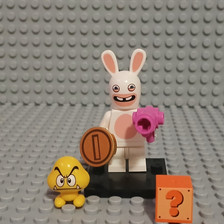
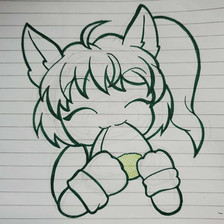
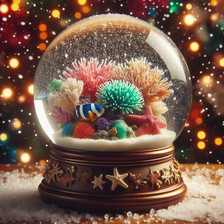
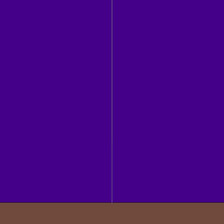

In [5]:
# Some images from the dataset:
np.random.seed(5)
pd.DataFrame(np.random.randint(0, len(tar.getmembers()), 25).reshape(5, 5)).style.format(embed_image)

In [61]:
embeddings = np.load('image_embeddings.npy')
embeddings.shape

(92350, 512)

<a id="2"></a> 
# Classifier


<a id="6"></a> 
## Zero Shot Prediction



**Background**: Contrastive Language-Image Pretraining (CLIP) is a primarily transformer-based model released by OpenAI in 2021 [1]. OpenAI trained it on a huge dataset of 400M text-image pairs that were scraped from across the internet.CLIP requires just image-text pairs rather than specific class labels thanks to the contrastive rather than classification focused training function. 

In [16]:
# Check the image size
img = get_image(0)
img_data = np.asarray(img)
img_data.shape

(192, 190, 3)

In [1]:
import numpy as np
import torch
from pkg_resources import packaging

print("Torch version:", torch.__version__)


Torch version: 2.3.0


In [2]:
! pip install ftfy regex tqdm
! pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /private/var/folders/w9/13d2twfd38j81zh0fbc9gf2r0000gn/T/pip-req-build-4xxbyfsm
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /private/var/folders/w9/13d2twfd38j81zh0fbc9gf2r0000gn/T/pip-req-build-4xxbyfsm
  Resolved https://github.com/openai/CLIP.git to commit a1d071733d7111c9c014f024669f959182114e33
  Preparing metadata (setup.py) ... done


In [3]:
import clip

clip.available_models()

['RN50',
 'RN101',
 'RN50x4',
 'RN50x16',
 'RN50x64',
 'ViT-B/32',
 'ViT-B/16',
 'ViT-L/14',
 'ViT-L/14@336px']

In [575]:
class CLIPImageClassifier:
    def __init__(self, model_name="ViT-B/32"):
        self.device = "cuda" if torch.cuda.is_available() else "cpu"
        self.model, self.preprocess = clip.load(model_name, device=self.device)
        # label definition {0:'mario', '1':frieren, '2':laezel, '3':other}
        self.text_prompts = {
            0: "A cartoon plumber jumping over obstacles called Mario",
            1: "A woman in a snowy landscape with ice magic called Frieren",
            2: "A character with red skin and horns fighting with a sword called Lae'zel",
            3: "An image that doesn't belong to Mario, Frieren or Lae'zel"
        }
        self.labels_list = list(self.text_prompts.keys())

    def classify_image(self, image_idx):
        image = self.preprocess(get_image(image_idx)).unsqueeze(0).to(self.device)
        text = clip.tokenize(self.text_prompts.values()).to(device)
        
        with torch.no_grad():
            
            image_features = self.model.encode_image(image)
            text_features = self.model.encode_text(text)
            
            logits_per_image, logits_per_text = self.model(image, text)
            probs = logits_per_image.softmax(dim=-1).cpu().numpy()
            
            predicted_class = list(self.text_prompts.keys())[np.argmax(probs)]
            
        return predicted_class

    def batch_process_images(self, image_lists):
        predictions = []
        for image_idx in image_lists:
            predicted_class = self.classify_image(image_idx)
            predictions.append(predicted_class)
        return predictions

    def save_predictions_to_dataframe(self, predictions, output_path):
        df = pd.DataFrame(predictions)
        df.to_csv(output_path, index=False)

# Example usage
classifier = CLIPImageClassifier(model_name="ViT-L/14@336px")
image_lists = np.arange(25) # Add more paths as needed
predictions = classifier.batch_process_images(image_lists)
# classifier.save_predictions_to_dataframe(predictions, "predictions.csv")


In [576]:
predictions

[3, 3, 3, 3, 0, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 0, 3, 3, 3, 3, 3, 3, 3]

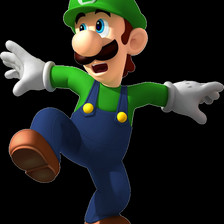

In [574]:
get_image(4)

**Note: the zero shot performance can be affected by the given prompt. The further work can include prompt engineering for better performance.**

<a id="7"></a> 
## Data Preparation

**Thoughts**: We can also use a simple classification model (like a feedforward neural network) on top of CLIP's image embeddings to perform classification. In order to achieve that, we need to label some data using the idea of clustering algorithm.

<a id="14"></a> 
### Get labeled data

***Idea***: We could use the similarity comparison to retrieve the silimar target in the image set and do a minor inpection afterwards for accuracy purpose.

In [59]:
class get_labeled_data:
    
    def __init__(self, examples_idx):
        self.mario_exm_idx, self.frieren_exm_idx, self.laezel_exm_idx = examples_idx
     
    def cosine_similarity(self, embedding_a, embedding_b):
        dot_product = np.dot(embedding_a, embedding_b)
        norm_a = np.linalg.norm(embedding_a)
        norm_b = np.linalg.norm(embedding_b)
        similarity = dot_product / (norm_a * norm_b)
        return similarity

    def euclidean_distance(self, embedding_a, embedding_b):
        distance = np.linalg.norm(embedding_a - embedding_b)
        return distance

    def manhattan_distance(self, embedding_a, embedding_b):
        distance = np.sum(np.abs(embedding_a - embedding_b))
        return distance
    
    def get_data(self, embeddings, charactor, similarity_func):
        
        if charactor == "mario":
            exm_idx = self.mario_exm_idx
        elif charactor == "frieren":
            exm_idx = self.frieren_exm_idx
        elif charactor == "laezel":
            exm_idx = self.laezel_exm_idx
        else:
            raise ValueError('No avaliable charactor')
        
        charactors = []
        if similarity_func == "cosine_similarity":
            for i in range(embeddings.shape[0]):
                charactors.append(self.cosine_similarity(embeddings[i], embeddings[exm_idx]))
                
        elif similarity_func == "euclidean_distance":
            for i in range(embeddings.shape[0]):
                charactors.append(self.euclidean_distance(embeddings[i], embeddings[exm_idx]))
                
        elif similarity_func == "manhattan_distance":
             for i in range(embeddings.shape[0]):
                charactors.append(self.manhattan_distance(embeddings[i], embeddings[exm_idx]))
        else:
            raise ValueError('No avaliable similarity func')
        
        return charactors

In [76]:
# Use cosine similarity
examples_idx = [56340, 30180, 49582]
gld = get_labeled_data(examples_idx)
mario_similarity = gld.get_data(embeddings, "mario", "cosine_similarity")
frieren_similarity = gld.get_data(embeddings, "frieren", "cosine_similarity")
laezel_similarity = gld.get_data(embeddings, "laezel", "cosine_similarity")

In [71]:
def plot_similarity_distribution(similarity_scores):
    plt.figure(figsize=(10, 6))
    plt.hist(similarity_scores, bins=20, color='skyblue', edgecolor='black')
    plt.xlabel('Similarity Scores')
    plt.ylabel('Frequency')
    plt.title('Distribution of Similarity Scores')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

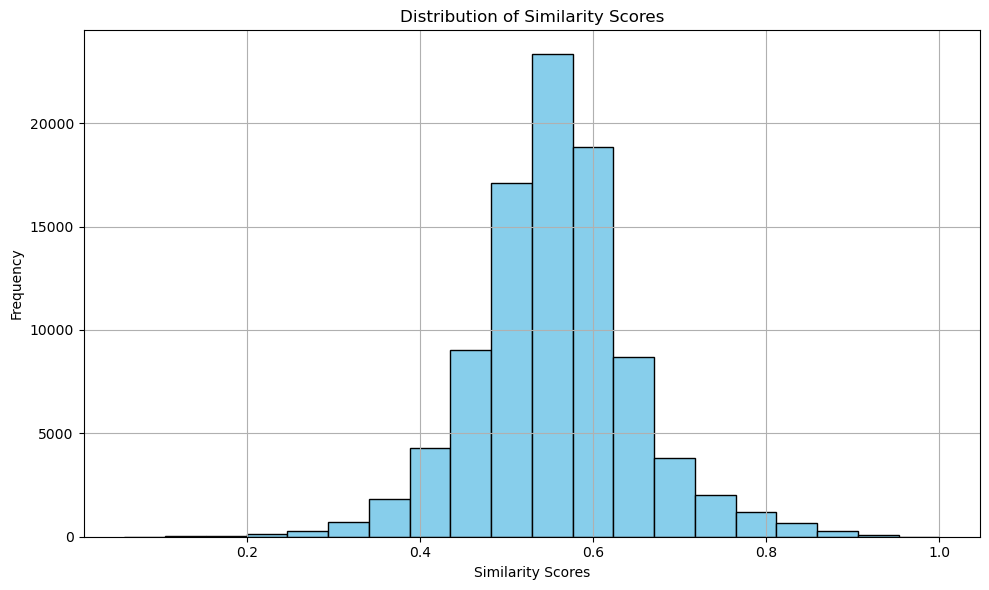

In [77]:
plot_similarity_distribution(mario_similarity)

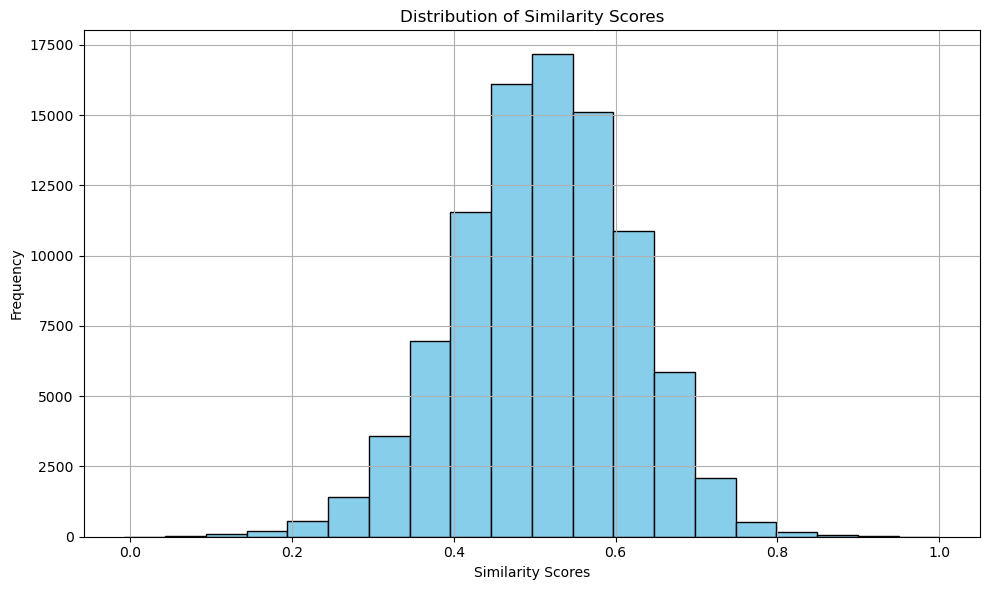

In [78]:
plot_similarity_distribution(frieren_similarity)

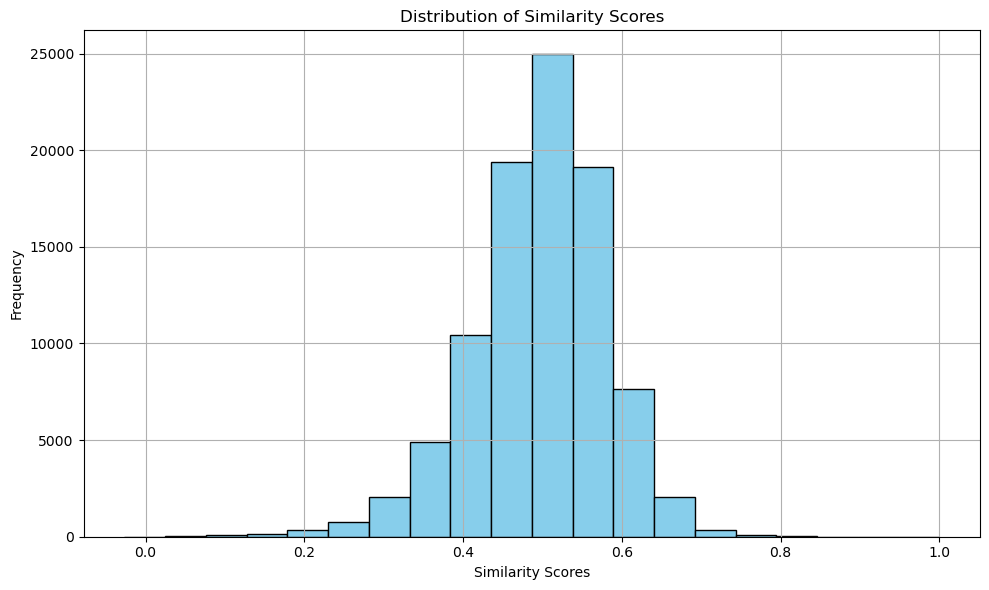

In [79]:
plot_similarity_distribution(laezel_similarity)

In [80]:
# Find the indexes with their values are higher than a certain thrrshold
def indexes_above_threshold(numbers, threshold):
    return [i for i, num in enumerate(numbers) if num > threshold]

,0,1,2,3,4
0,,,,,
1,,,,,
2,,,,,
3,,,,,
4,,,,,
5,,,,,
6,,,,,
7,,,,,
8,,,,,
9,,,,,

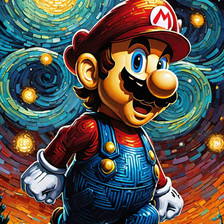
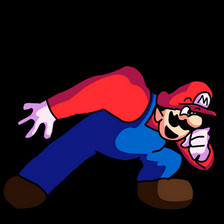
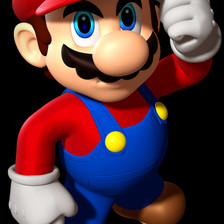
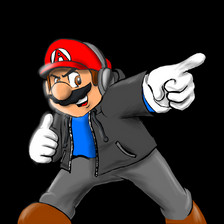
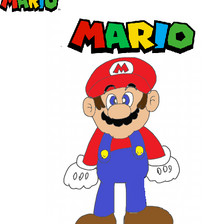
...
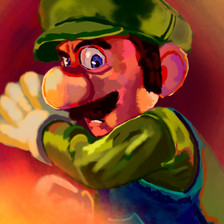
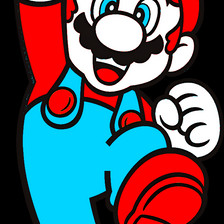
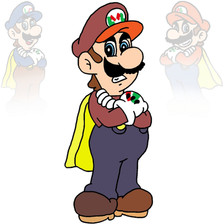
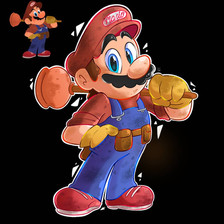
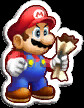

In [101]:
# Find out a proper threshold for Mario
import random
"""
# When set up to 0.9, all 100 images are Mario
# When set up to 0.85, 96/100 images contain Mario, the remaining images contain Luigi. This can be a challenge
# When set up to 0.8, 89/100 images contain Mario
"""
pd.DataFrame(np.array(random.choices(indexes_above_threshold(mario_similarity, threshold=0.85), k=100)).reshape(20, 5)).style.format(embed_image)


,0,1,2,3,4
0,,,,,
1,,,,,
2,,,,,
3,,,,,
4,,,,,
5,,,,,
6,,,,,
7,,,,,
8,,,,,
9,,,,,

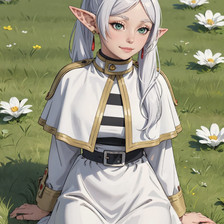
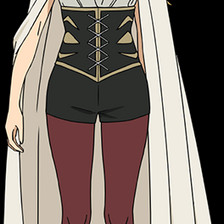
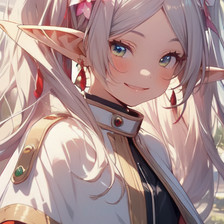
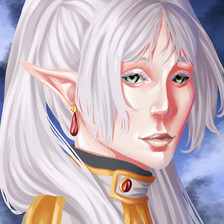
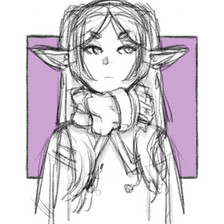
...
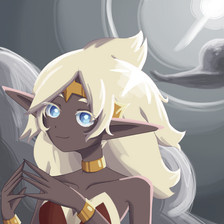
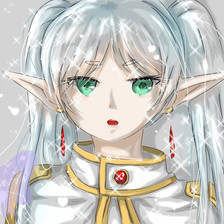
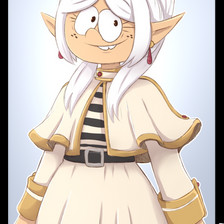
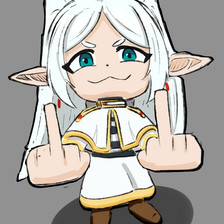
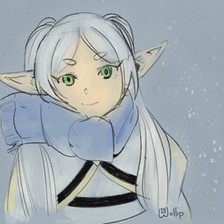

In [95]:
# Find out a proper threshold for frieren
"""
# When set up to 0.9, all 100 images are frieren
# When set up to 0.85, all 100 images contain frieren
# When set up to 0.8, 99/100 images contain frieren
# When set up to 0.75, 88/100 images contain frieren
"""
pd.DataFrame(np.array(random.choices(indexes_above_threshold(frieren_similarity, threshold=0.8), k=100)).reshape(20, 5)).style.format(embed_image)


,0,1,2,3,4
0,,,,,
1,,,,,
2,,,,,
3,,,,,
4,,,,,
5,,,,,
6,,,,,
7,,,,,
8,,,,,
9,,,,,

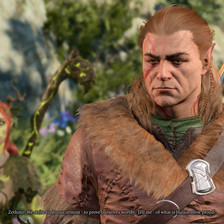
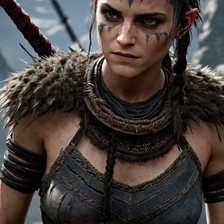
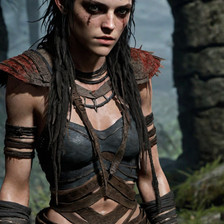
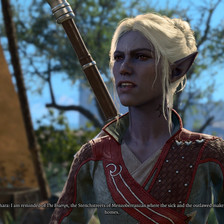
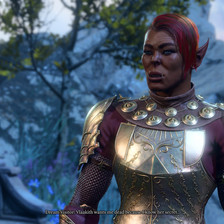
...
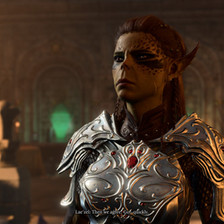
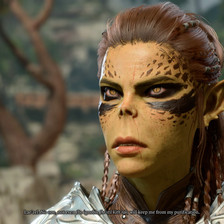
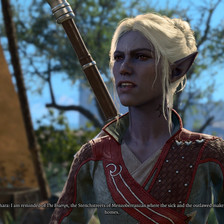
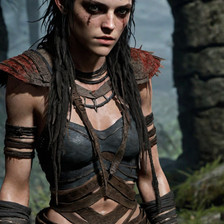
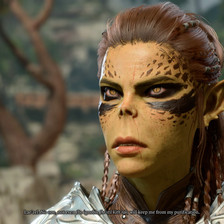

In [103]:
# Find out a proper threshold for laezel
"""
Duplicates Warning: When set up to 0.9, all 100 images are laezel, and all the images are the same!!
# When set up to 0.85, all 100 images contain laezel, but actually have two iamges only!!
# When set up to 0.8, most of them are not laezel and duplicates happen as well
"""
pd.DataFrame(np.array(random.choices(indexes_above_threshold(laezel_similarity, threshold=0.8), k=100)).reshape(20, 5)).style.format(embed_image)


In [298]:
# Build up the labeled dataset for Mario and add Luigi as negative samples
print(len(indexes_above_threshold(mario_similarity, threshold=0.85)))
print(len(indexes_above_threshold(frieren_similarity, threshold=0.8)))

417
244


In [301]:
import os

def create_folder(folder_name):
    try:
        os.makedirs(folder_name)
        print(f"Folder '{folder_name}' created successfully.")
    except FileExistsError:
        print(f"Folder '{folder_name}' already exists.")
        
def save_images_to_folder(images_index, folder_name):
    for index in images_index:
        image = get_image(index)
        image_path = os.path.join(folder_name, f"{index}.jpg")
        image.save(image_path)
#         print(f"Image saved to '{image_path}'.")

In [302]:
create_folder("mario_folder")
save_images_to_folder(indexes_above_threshold(mario_similarity, threshold=0.85), "mario_folder")

create_folder("frieren_folder")
save_images_to_folder(indexes_above_threshold(frieren_similarity, threshold=0.8), "frieren_folder")

Folder 'mario_folder' already exists.
Folder 'frieren_folder' created successfully.


**Please note that the human inspection in this step is important. I manually remove the obviously wrongly labeled data to the folder "other_folder" and delete some condusing images directly. I prefer to not direclt delete all the mismatch but save them as negative samples to improve the robustness of the model**

In [303]:
mario_mismatch = [4, 23, 2136, 2114, 4908, 3442, 8377, 9162, 10001, 10638, 12260, 13808, 16262, 16025, 17468, 18578, 22415, 27304, 34231, 49870, 50005,  \
                 51308, 53418, 58354, 59721, 60603, 60325, 63278, 67442, 69461, 71489, 73322, 73706, 74959, 74495, 77063, 79125, 81234, 83883, 83799, ]

In [304]:
frieren_mismatch = [6709, 16084, 22845, 37729, 38184, 60963, 60490,84202, 85174, 90538, ]

,0
0,
1,
2,
3,

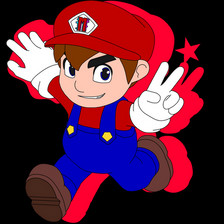
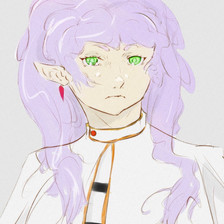
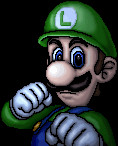
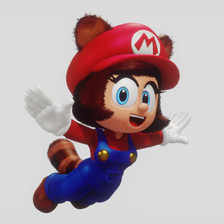

In [602]:
"""
Let us visulaize some mismatches for better understanding. 
It can be seen that the identified mismatches are indeed hard to classify since they are so close to our target
"""
pd.DataFrame(random.choices(mario_mismatch+frieren_mismatch, k=4)).style.format(embed_image)

In [306]:
# Move the mismatches to the "other_folder"
import shutil

def move_images_to_folder(images_idx, original_folder, destination_folder):
    for image_idx in images_idx:
        image_path = os.path.join(original_folder, f"{image_idx}.jpg")
        if os.path.exists(image_path):
            shutil.move(image_path, destination_folder)
            print(f"Image '{image_path}' moved to '{destination_folder}'.")
        else:
            print(f"Image '{image_path}' does not exist.")

create_folder("other_folder")
move_images_to_folder(mario_mismatch, "mario_folder", "other_folder")
move_images_to_folder(frieren_mismatch, "frieren_folder", "other_folder")

Folder 'other_folder' created successfully.
Image 'mario_folder/4.jpg' moved to 'other_folder'.
Image 'mario_folder/23.jpg' moved to 'other_folder'.
Image 'mario_folder/2136.jpg' moved to 'other_folder'.
Image 'mario_folder/2114.jpg' moved to 'other_folder'.
Image 'mario_folder/4908.jpg' moved to 'other_folder'.
Image 'mario_folder/3442.jpg' moved to 'other_folder'.
Image 'mario_folder/8377.jpg' moved to 'other_folder'.
Image 'mario_folder/9162.jpg' moved to 'other_folder'.
Image 'mario_folder/10001.jpg' moved to 'other_folder'.
Image 'mario_folder/10638.jpg' moved to 'other_folder'.
Image 'mario_folder/12260.jpg' moved to 'other_folder'.
Image 'mario_folder/13808.jpg' moved to 'other_folder'.
Image 'mario_folder/16262.jpg' moved to 'other_folder'.
Image 'mario_folder/16025.jpg' moved to 'other_folder'.
Image 'mario_folder/17468.jpg' moved to 'other_folder'.
Image 'mario_folder/18578.jpg' moved to 'other_folder'.
Image 'mario_folder/22415.jpg' moved to 'other_folder'.
Image 'mario_fold

<a id="15"></a> 
### Fix the issue of lack of laezel images

Now let us find some laezel images from the internet

In [118]:
import requests
from bs4 import BeautifulSoup
import os
import urllib.parse
from selenium import webdriver

def fetch_images(query, num_images=10):
    # Encode query to URL format
    query_encoded = urllib.parse.quote(query)
    url = f"https://www.google.com/search?q={query_encoded}&tbm=isch"

    # Send a GET request to the URL
    headers = {"User-Agent": "Mozilla/5.0"}
    response = requests.get(url, headers=headers)
    response.raise_for_status()

    # Parse the HTML response
    soup = BeautifulSoup(response.text, "html.parser")

    # Extract image URLs
    image_urls = []
    for img in soup.find_all("img", class_="t0fcAb"):
        image_url = img.get("src")
        if image_url:
            image_urls.append(image_url)

    return image_urls[:num_images]

def download_images(image_urls, output_folder):
    os.makedirs(output_folder, exist_ok=True)
    for i, image_url in enumerate(image_urls):
        response = requests.get(image_url)
        with open(os.path.join(output_folder, f"image_{i}.jpg"), "wb") as f:
            f.write(response.content)

# Example usage
query = "Lae'zel Baldur's Gate 3"
num_images = 200
output_folder = "laezel_images"

image_urls = fetch_images(query, num_images)
download_images(image_urls, output_folder)

In [184]:
# Clean the downloaded images by first resizing them to (192, 190) and also convert them to .jpg format 
from PIL import Image
import os

def resize_and_rename_images(folder_path, output_folder, new_size=(192, 190)):
    os.makedirs(output_folder, exist_ok=True)
    for i, filename in enumerate(os.listdir(folder_path)):
        input_path = os.path.join(folder_path, filename)
        try:
            # Open image
            with Image.open(input_path) as img:
                # Resize image
                resized_img = img.resize(new_size)
                # Convert image to RGB if not already in that format
                if resized_img.mode != "RGB":
                    resized_img = resized_img.convert("RGB")
                # Save resized image with new filename
                output_path = os.path.join(output_folder, f"{i+92350}.jpg") # Since the org folder contains 92350 images
                resized_img.save(output_path, "JPEG")
                print(f"Image '{filename}' resized and saved as '{output_path}'.")
        except Exception as e:
            os.remove(input_path)
            print(f"File '{input_path}' deleted successfully.")

# Example usage
input_folder = "laezel_images"
output_folder = "laezel_folder"
resize_and_rename_images(input_folder, output_folder)

Image '640px-Laezel (1).png' resized and saved as 'laezel_folder/92350.jpg'.
Image 'download (66).jpeg' resized and saved as 'laezel_folder/92351.jpg'.
Image 'download.jpeg' resized and saved as 'laezel_folder/92352.jpg'.
Image 'best-lae-zel-build-in-baldurs-gate-3 (1).webp' resized and saved as 'laezel_folder/92353.jpg'.
Image 'Baldur's_Gate_3_Lae'zel (1).jpg' resized and saved as 'laezel_folder/92354.jpg'.
Image 'download (80).jpeg' resized and saved as 'laezel_folder/92355.jpg'.
Image 'L1IhT (1).jpg' resized and saved as 'laezel_folder/92356.jpg'.
Image 'pf3vxbYCY8FEHHWi6sirQB (1).jpg' resized and saved as 'laezel_folder/92357.jpg'.
Image 'download (64).jpeg' resized and saved as 'laezel_folder/92358.jpg'.
Image 'Baldurs-Gate-3-Laezel-Unlock-Location (1).jpg' resized and saved as 'laezel_folder/92359.jpg'.
Image 'download (59).jpeg' resized and saved as 'laezel_folder/92360.jpg'.
Image 'download (60).jpeg' resized and saved as 'laezel_folder/92361.jpg'.
Image 'download (3).jpeg' res

Image 'Baldurs-Gate-3_20231012155644 (1).webp' resized and saved as 'laezel_folder/92461.jpg'.
Image 'download (57).jpeg' resized and saved as 'laezel_folder/92462.jpg'.


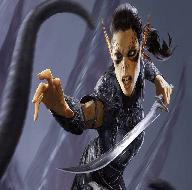

In [617]:
# Let us review some of the laezel images for sanity checka and they look good
Image.open(f"images/{random.choice(np.arange(92350, 92463))}.jpg")

In [185]:
# copy the new laezel images to the org images folder
import shutil

def copy_images_to_folder(images_idx, original_folder, destination_folder):
    for image_idx in images_idx:
        image_path = os.path.join(original_folder, f"{image_idx}.jpg")
        if os.path.exists(image_path):
            shutil.copy(image_path, destination_folder)
            print(f"Image '{image_path}' copied to '{destination_folder}'.")
        else:
            print(f"Image '{image_path}' does not exist.")

copy_images_to_folder(np.arange(92350, 92463), "laezel_folder", "images")

Image 'laezel_folder/92350.jpg' copied to 'images'.
Image 'laezel_folder/92351.jpg' copied to 'images'.
Image 'laezel_folder/92352.jpg' copied to 'images'.
Image 'laezel_folder/92353.jpg' copied to 'images'.
Image 'laezel_folder/92354.jpg' copied to 'images'.
Image 'laezel_folder/92355.jpg' copied to 'images'.
Image 'laezel_folder/92356.jpg' copied to 'images'.
Image 'laezel_folder/92357.jpg' copied to 'images'.
Image 'laezel_folder/92358.jpg' copied to 'images'.
Image 'laezel_folder/92359.jpg' copied to 'images'.
Image 'laezel_folder/92360.jpg' copied to 'images'.
Image 'laezel_folder/92361.jpg' copied to 'images'.
Image 'laezel_folder/92362.jpg' copied to 'images'.
Image 'laezel_folder/92363.jpg' copied to 'images'.
Image 'laezel_folder/92364.jpg' copied to 'images'.
Image 'laezel_folder/92365.jpg' copied to 'images'.
Image 'laezel_folder/92366.jpg' copied to 'images'.
Image 'laezel_folder/92367.jpg' copied to 'images'.
Image 'laezel_folder/92368.jpg' copied to 'images'.
Image 'laeze

<a id="16"></a> 
### Build up training/val dataset

**Since we will evaluate our model on the test dataset, so let us make sure there is no images for evaluation be used in the training stage**

In [313]:
# Let us check whether thare are overlapping images between the training set and the test set

def remove_images_with_index(folder_path, reference_list):
    try:
        # List all items in the folder
        for filename in os.listdir(folder_path):
            # Extract index from filename
#             print(filename.split('.')[0])
            index = filename.split('.')[0]
            # Check if index is in the reference list
            if index in reference_list:
                # If yes, remove the image
                os.remove(os.path.join(folder_path, filename))
                print(f"Image '{filename}' removed.")
    except FileNotFoundError:
        print("Folder not found.")

# Remove
test_set = pd.read_csv("test_set.csv")
reference_list = list(test_set["index"]) # List of reference indices
remove_images_with_index("mario_folder", reference_list)
remove_images_with_index("frieren_folder", reference_list)
remove_images_with_index("laezel_folder", reference_list)

# It turns out that there is no such images. Yay

**Now creates folder for "other images"**

In [314]:
# Count how many training images we have currently

def count_items_in_folder(folder_path):
    try:
        # List all items in the folder
        items = os.listdir(folder_path)
        # Count the number of items
        num_items = len(items)
        print(f"There are {num_items} items in the folder.")
    except FileNotFoundError:
        print("Folder not found.")

In [315]:
count_items_in_folder("mario_folder")

There are 377 items in the folder.


In [316]:
count_items_in_folder("frieren_folder")

There are 234 items in the folder.


In [317]:
count_items_in_folder("laezel_folder")

There are 114 items in the folder.


**Save the image idx for each class**

In [319]:
marios = []
for filename in os.listdir("mario_folder"):
    index = filename.split('.')[0]
    marios.append(index)
len(marios)

377

In [320]:
frierens = []
for filename in os.listdir("frieren_folder"):
    index = filename.split('.')[0]
    frierens.append(index)
len(frierens)

234

In [360]:
laezels = []
for filename in os.listdir("laezel_folder"):
    index = filename.split('.')[0]
    laezels.append(index)
len(laezels)

114

In [361]:
laezels.remove('')
len(laezels)

113

In [322]:
others = mario_mismatch + frieren_mismatch
len(others)

50

In [323]:
ref = marios + frierens + laezels + others + list(test_set["index"])
len(ref)

875

**Randomly select 400 images that are not marios/frieren/laezel**

In [327]:
selection = random.choices(np.arange(92463), k=400)

for idx in selection:
    if idx in ref:
        continue
    else:
        image_path = os.path.join("images", f"{idx}.jpg")
        shutil.copy(image_path, "other_folder")
        print(f"Image '{image_path}' copied to other_folde.")

Image 'images/88169.jpg' copied to other_folde.
Image 'images/3989.jpg' copied to other_folde.
Image 'images/66179.jpg' copied to other_folde.
Image 'images/52039.jpg' copied to other_folde.
Image 'images/15537.jpg' copied to other_folde.
Image 'images/39930.jpg' copied to other_folde.
Image 'images/83908.jpg' copied to other_folde.
Image 'images/7724.jpg' copied to other_folde.
Image 'images/83027.jpg' copied to other_folde.
Image 'images/12930.jpg' copied to other_folde.
Image 'images/18598.jpg' copied to other_folde.
Image 'images/53460.jpg' copied to other_folde.
Image 'images/79521.jpg' copied to other_folde.
Image 'images/56592.jpg' copied to other_folde.
Image 'images/23457.jpg' copied to other_folde.
Image 'images/38047.jpg' copied to other_folde.
Image 'images/76251.jpg' copied to other_folde.
Image 'images/40471.jpg' copied to other_folde.
Image 'images/81798.jpg' copied to other_folde.
Image 'images/40728.jpg' copied to other_folde.
Image 'images/17714.jpg' copied to other_f

Image 'images/55787.jpg' copied to other_folde.
Image 'images/2717.jpg' copied to other_folde.
Image 'images/9469.jpg' copied to other_folde.
Image 'images/33583.jpg' copied to other_folde.
Image 'images/33038.jpg' copied to other_folde.
Image 'images/55395.jpg' copied to other_folde.
Image 'images/65341.jpg' copied to other_folde.
Image 'images/66587.jpg' copied to other_folde.
Image 'images/23342.jpg' copied to other_folde.
Image 'images/47112.jpg' copied to other_folde.
Image 'images/72690.jpg' copied to other_folde.
Image 'images/53632.jpg' copied to other_folde.
Image 'images/48663.jpg' copied to other_folde.
Image 'images/10321.jpg' copied to other_folde.
Image 'images/87845.jpg' copied to other_folde.
Image 'images/67610.jpg' copied to other_folde.
Image 'images/79563.jpg' copied to other_folde.
Image 'images/68400.jpg' copied to other_folde.
Image 'images/18471.jpg' copied to other_folde.
Image 'images/41341.jpg' copied to other_folde.
Image 'images/51930.jpg' copied to other_f

Image 'images/5755.jpg' copied to other_folde.
Image 'images/59195.jpg' copied to other_folde.
Image 'images/85971.jpg' copied to other_folde.
Image 'images/87172.jpg' copied to other_folde.
Image 'images/64337.jpg' copied to other_folde.
Image 'images/57123.jpg' copied to other_folde.
Image 'images/20770.jpg' copied to other_folde.
Image 'images/90091.jpg' copied to other_folde.
Image 'images/67301.jpg' copied to other_folde.
Image 'images/31377.jpg' copied to other_folde.
Image 'images/1770.jpg' copied to other_folde.
Image 'images/32377.jpg' copied to other_folde.
Image 'images/7213.jpg' copied to other_folde.
Image 'images/52086.jpg' copied to other_folde.
Image 'images/15318.jpg' copied to other_folde.
Image 'images/8270.jpg' copied to other_folde.
Image 'images/47367.jpg' copied to other_folde.
Image 'images/35746.jpg' copied to other_folde.
Image 'images/82560.jpg' copied to other_folde.
Image 'images/18594.jpg' copied to other_folde.
Image 'images/65486.jpg' copied to other_fol

Do a manually inspection and then remove the mario/frueren/laezel images and then check the numbers

In [371]:
others = []
for filename in os.listdir("other_folder"):
    index = filename.split('.')[0]
    others.append(index)
len(others)

437

In [373]:
others.remove('')
len(others)

436

<a id="17"></a> 
### Extract embedding for new laezel images

Noted that we do not have embeddinds for the new laezel images. Let us extract embeddings for them first

In [344]:
# Load CLIP model
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device) # Use the defulat model since I do not know which model you used before

# Preprocess images and encode them
def encode_images(image_index):
    embeddings = []
    for idx in image_index:
        image_path = os.path.join("images", f"{idx}.jpg")
        image = preprocess(Image.open(image_path)).unsqueeze(0).to(device)
        with torch.no_grad():
            image_features = model.encode_image(image)
            embeddings.append(image_features.cpu().numpy())
    return embeddings

# Example usage
image_embeddings = encode_images(np.arange(92350, 92463))
print("Embeddings shape:", image_embeddings[0].shape)  # Shape of the first image's embedding

Embeddings shape: (1, 512)


In [345]:
# Stack the arrays vertically
final_embeddings = np.vstack((embeddings, np.array(image_embeddings).reshape(113,512)))

# Check the shape of the final array
print("Shape of final embeddings:", final_embeddings.shape)

Shape of final embeddings: (92463, 512)


#### HORRY! Let us build a simple classsification model now

<a id="8"></a> 
### Logistic regression

In [374]:
len(marios + frierens + laezels + others)

1160

In [375]:
marios_array = [[x, 0] for x in marios]
frierens_array = [[x, 1] for x in frierens]
laezels_array = [[x, 2] for x in laezels]
others_array = [[x, 3] for x in others]
labeled_data = pd.DataFrame(marios_array + frierens_array + laezels_array + others_array, columns=["idx", "label"])

In [376]:
labeled_data['idx'] = labeled_data['idx'].astype(int)
labeled_data.dtypes

idx      int64
label    int64
dtype: object

In [401]:
final_embeddings.shape

(92463, 512)

In [405]:
features = final_embeddings[np.array(labeled_data['idx'])]
features.shape

(1160, 512)

In [406]:
# Sanity check
random.choice(list(labeled_data['idx']))

34231

In [409]:
labeled_data.query('idx==34231')

,idx,label,feature
893,34231,3,"[-0.30817574, 0.3196286, 0.14659984, 0.2015398..."


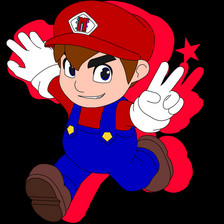

In [410]:
get_image(34231)

In [415]:
all(final_embeddings[34231] == features[labeled_data.query('idx==34231').index[0]])

True

In [417]:
X = features
y = labeled_data.label

print(X.shape)
print(y.shape)

(1160, 512)
(1160,)


In [422]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def evaluate(y_true, y_pred):
    # Calculate accuracy
    accuracy = accuracy_score(y_true, y_pred)
    
    # Calculate precision, recall, and F1-score
    precision = precision_score(y_true, y_pred, average='macro')
    recall = recall_score(y_true, y_pred, average='macro')
    f1 = f1_score(y_true, y_pred, average='macro')
    
    return {
        'accuracy': round(accuracy, 3),
        'precision': round(precision, 3),
        'recall': round(recall, 3),
        'f1_score': round(f1, 3)
    }


In [620]:
"""Using grid serach to find a set of good hyperparameters for Logistic regression problem"""
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

# define models and parameters
lg_model = LogisticRegression(random_state=0, max_iter=1000)
solvers = ['newton-cg', 'lbfgs', 'liblinear']
penalty = ['l1', 'l2']
c_values = [100, 10, 1.0, 0.1, 0.01]
# define grid search
grid = dict(solver=solvers,penalty=penalty,C=c_values)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=lg_model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(X_train, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users

/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users

/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users

/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users

Best: 0.964943 using {'C': 1.0, 'penalty': 'l2', 'solver': 'newton-cg'}
0.000000 (0.000000) with: {'C': 100, 'penalty': 'l1', 'solver': 'newton-cg'}
0.000000 (0.000000) with: {'C': 100, 'penalty': 'l1', 'solver': 'lbfgs'}
0.955747 (0.016617) with: {'C': 100, 'penalty': 'l1', 'solver': 'liblinear'}
0.963506 (0.016758) with: {'C': 100, 'penalty': 'l2', 'solver': 'newton-cg'}
0.963506 (0.016758) with: {'C': 100, 'penalty': 'l2', 'solver': 'lbfgs'}
0.961782 (0.015370) with: {'C': 100, 'penalty': 'l2', 'solver': 'liblinear'}
0.000000 (0.000000) with: {'C': 10, 'penalty': 'l1', 'solver': 'newton-cg'}
0.000000 (0.000000) with: {'C': 10, 'penalty': 'l1', 'solver': 'lbfgs'}
0.961207 (0.017205) with: {'C': 10, 'penalty': 'l1', 'solver': 'liblinear'}
0.964655 (0.016410) with: {'C': 10, 'penalty': 'l2', 'solver': 'newton-cg'}
0.964655 (0.016410) with: {'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}
0.964655 (0.016105) with: {'C': 10, 'penalty': 'l2', 'solver': 'liblinear'}
0.000000 (0.000000) with: 

/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:425: FitFailedWarning: 
300 fits failed out of a total of 900.
The score on these train-test partitions for these parameters will be set to 0.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
150 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/sklearn/base.py", line 1151, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/sklearn/lin

In [630]:
from sklearn.model_selection import train_test_split

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Perform logistic regression and set the parameter using the selected ones
lg_classifier = LogisticRegression(random_state=0, C=1.0, penalty='l2', solver='newton-cg', max_iter=1000, verbose=1)
lg_classifier.fit(X_train, y_train)

# Evaluate using the logistic regression classifier
y_pred = lg_classifier.predict(X_test)
evl = evaluate(y_test, y_pred)
print(evl)

{'accuracy': 0.957, 'precision': 0.964, 'recall': 0.971, 'f1_score': 0.966}


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


In [703]:
import joblib

# Save the trained model to a file
joblib.dump(lg_classifier, 'logistic_regression_model.pkl')

['logistic_regression_model.pkl']

In [631]:
y_train.value_counts()

label
3    351
0    298
1    184
2     95
Name: count, dtype: int64

In [632]:
y_test.value_counts()

label
3    85
0    79
1    50
2    18
Name: count, dtype: int64

In [633]:
len(y_test)

232

The results are quite good :) 

<a id="9"></a> 
### Simple Feed-forward NN

<a id="18"></a> 
#### One additional layer

In [650]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

# Define the classification model
class SimpleClassifier1(nn.Module):
    def __init__(self, input_size, num_classes):
        super(SimpleClassifier1, self).__init__()
        self.fc1 = nn.Linear(input_size, num_classes)
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        x = self.fc1(x)
        x = self.softmax(x)
        return x
    
# Convert data to PyTorch tensors
X_train_tensor = torch.tensor(X_train)
y_train_tensor = torch.tensor(np.array(y_train))
X_test_tensor = torch.tensor(X_test)
y_test_tensor = torch.tensor(np.array(y_test))

# Create DataLoader for training and validation sets
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
test_loader = DataLoader(test_dataset, batch_size=232)

# Initialize the classification model
input_size = 512  # Size of CLIP embeddings
num_classes = 4
nn_classifier1 = SimpleClassifier1(input_size, num_classes).to(device)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer1 = optim.Adam(nn_classifier1.parameters(), lr=0.01) # I have tried use lr=0.1/0.01/0.001

# Train the model
num_epochs = 500
for epoch in range(num_epochs):
    nn_classifier1.train()
    running_loss = 0.0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer1.zero_grad()
        outputs = nn_classifier1(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer1.step()
        running_loss += loss.item() * inputs.size(0)
    epoch_loss = running_loss / len(train_loader.dataset)
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}")

Epoch 1/500, Loss: 0.9122
Epoch 2/500, Loss: 0.8056
Epoch 3/500, Loss: 0.7942
Epoch 4/500, Loss: 0.7877
Epoch 5/500, Loss: 0.7836
Epoch 6/500, Loss: 0.7766
Epoch 7/500, Loss: 0.7761
Epoch 8/500, Loss: 0.7712
Epoch 9/500, Loss: 0.7669
Epoch 10/500, Loss: 0.7648
Epoch 11/500, Loss: 0.7622
Epoch 12/500, Loss: 0.7612
Epoch 13/500, Loss: 0.7601
Epoch 14/500, Loss: 0.7593
Epoch 15/500, Loss: 0.7594
Epoch 16/500, Loss: 0.7577
Epoch 17/500, Loss: 0.7567
Epoch 18/500, Loss: 0.7561
Epoch 19/500, Loss: 0.7555
Epoch 20/500, Loss: 0.7543
Epoch 21/500, Loss: 0.7541
Epoch 22/500, Loss: 0.7537
Epoch 23/500, Loss: 0.7534
Epoch 24/500, Loss: 0.7533
Epoch 25/500, Loss: 0.7531
Epoch 26/500, Loss: 0.7530
Epoch 27/500, Loss: 0.7538
Epoch 28/500, Loss: 0.7531
Epoch 29/500, Loss: 0.7526
Epoch 30/500, Loss: 0.7524
Epoch 31/500, Loss: 0.7523
Epoch 32/500, Loss: 0.7523
Epoch 33/500, Loss: 0.7521
Epoch 34/500, Loss: 0.7514
Epoch 35/500, Loss: 0.7512
Epoch 36/500, Loss: 0.7511
Epoch 37/500, Loss: 0.7509
Epoch 38/5

Epoch 305/500, Loss: 0.7480
Epoch 306/500, Loss: 0.7480
Epoch 307/500, Loss: 0.7480
Epoch 308/500, Loss: 0.7480
Epoch 309/500, Loss: 0.7480
Epoch 310/500, Loss: 0.7480
Epoch 311/500, Loss: 0.7480
Epoch 312/500, Loss: 0.7480
Epoch 313/500, Loss: 0.7480
Epoch 314/500, Loss: 0.7480
Epoch 315/500, Loss: 0.7480
Epoch 316/500, Loss: 0.7480
Epoch 317/500, Loss: 0.7480
Epoch 318/500, Loss: 0.7480
Epoch 319/500, Loss: 0.7480
Epoch 320/500, Loss: 0.7480
Epoch 321/500, Loss: 0.7480
Epoch 322/500, Loss: 0.7480
Epoch 323/500, Loss: 0.7480
Epoch 324/500, Loss: 0.7480
Epoch 325/500, Loss: 0.7480
Epoch 326/500, Loss: 0.7480
Epoch 327/500, Loss: 0.7480
Epoch 328/500, Loss: 0.7480
Epoch 329/500, Loss: 0.7480
Epoch 330/500, Loss: 0.7480
Epoch 331/500, Loss: 0.7480
Epoch 332/500, Loss: 0.7480
Epoch 333/500, Loss: 0.7480
Epoch 334/500, Loss: 0.7480
Epoch 335/500, Loss: 0.7480
Epoch 336/500, Loss: 0.7480
Epoch 337/500, Loss: 0.7480
Epoch 338/500, Loss: 0.7480
Epoch 339/500, Loss: 0.7480
Epoch 340/500, Loss:

In [664]:
# Evaluate the model
nn_classifier1.eval()

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = nn_classifier1(inputs)
#         print(outputs.shape)
        _, predicted = torch.max(outputs, 1)
        prediction1 = predicted.numpy()

evl = evaluate(y_test, prediction1)
print(evl)

{'accuracy': 0.953, 'precision': 0.959, 'recall': 0.967, 'f1_score': 0.962}


<a id="19"></a> 
#### Two additional layers

In [661]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

# Define the classification model
class SimpleClassifier2(nn.Module):
    def __init__(self, input_size, hidden_size, num_classes):
        super(SimpleClassifier2, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, num_classes)
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        x = self.softmax(x)
        return x
    
# Convert data to PyTorch tensors
X_train_tensor = torch.tensor(X_train)
y_train_tensor = torch.tensor(np.array(y_train))
X_test_tensor = torch.tensor(X_test)
y_test_tensor = torch.tensor(np.array(y_test))

# Create DataLoader for training and validation sets
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
test_loader = DataLoader(test_dataset, batch_size=232)

# Initialize the classification model
input_size = 512  # Size of CLIP embeddings
hidden_size = 256
num_classes = 4
nn_classifier2 = SimpleClassifier2(input_size, hidden_size, num_classes).to(device)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer2 = optim.Adam(nn_classifier2.parameters(), lr=0.001)

# Train the model
num_epochs = 500
for epoch in range(num_epochs):
    nn_classifier2.train()
    running_loss = 0.0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer2.zero_grad()
        outputs = nn_classifier2(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer2.step()
        running_loss += loss.item() * inputs.size(0)
    epoch_loss = running_loss / len(train_loader.dataset)
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}")

Epoch 1/500, Loss: 1.0272
Epoch 2/500, Loss: 0.8126
Epoch 3/500, Loss: 0.7967
Epoch 4/500, Loss: 0.7904
Epoch 5/500, Loss: 0.7885
Epoch 6/500, Loss: 0.7803
Epoch 7/500, Loss: 0.7773
Epoch 8/500, Loss: 0.7733
Epoch 9/500, Loss: 0.7708
Epoch 10/500, Loss: 0.7644
Epoch 11/500, Loss: 0.7617
Epoch 12/500, Loss: 0.7582
Epoch 13/500, Loss: 0.7571
Epoch 14/500, Loss: 0.7567
Epoch 15/500, Loss: 0.7558
Epoch 16/500, Loss: 0.7555
Epoch 17/500, Loss: 0.7545
Epoch 18/500, Loss: 0.7543
Epoch 19/500, Loss: 0.7542
Epoch 20/500, Loss: 0.7540
Epoch 21/500, Loss: 0.7540
Epoch 22/500, Loss: 0.7540
Epoch 23/500, Loss: 0.7540
Epoch 24/500, Loss: 0.7535
Epoch 25/500, Loss: 0.7530
Epoch 26/500, Loss: 0.7529
Epoch 27/500, Loss: 0.7527
Epoch 28/500, Loss: 0.7526
Epoch 29/500, Loss: 0.7526
Epoch 30/500, Loss: 0.7526
Epoch 31/500, Loss: 0.7525
Epoch 32/500, Loss: 0.7525
Epoch 33/500, Loss: 0.7525
Epoch 34/500, Loss: 0.7525
Epoch 35/500, Loss: 0.7525
Epoch 36/500, Loss: 0.7525
Epoch 37/500, Loss: 0.7525
Epoch 38/5

Epoch 302/500, Loss: 0.7491
Epoch 303/500, Loss: 0.7491
Epoch 304/500, Loss: 0.7491
Epoch 305/500, Loss: 0.7491
Epoch 306/500, Loss: 0.7491
Epoch 307/500, Loss: 0.7491
Epoch 308/500, Loss: 0.7491
Epoch 309/500, Loss: 0.7491
Epoch 310/500, Loss: 0.7491
Epoch 311/500, Loss: 0.7491
Epoch 312/500, Loss: 0.7491
Epoch 313/500, Loss: 0.7491
Epoch 314/500, Loss: 0.7491
Epoch 315/500, Loss: 0.7491
Epoch 316/500, Loss: 0.7491
Epoch 317/500, Loss: 0.7491
Epoch 318/500, Loss: 0.7491
Epoch 319/500, Loss: 0.7491
Epoch 320/500, Loss: 0.7491
Epoch 321/500, Loss: 0.7491
Epoch 322/500, Loss: 0.7491
Epoch 323/500, Loss: 0.7491
Epoch 324/500, Loss: 0.7491
Epoch 325/500, Loss: 0.7491
Epoch 326/500, Loss: 0.7491
Epoch 327/500, Loss: 0.7491
Epoch 328/500, Loss: 0.7491
Epoch 329/500, Loss: 0.7491
Epoch 330/500, Loss: 0.7491
Epoch 331/500, Loss: 0.7491
Epoch 332/500, Loss: 0.7491
Epoch 333/500, Loss: 0.7491
Epoch 334/500, Loss: 0.7491
Epoch 335/500, Loss: 0.7504
Epoch 336/500, Loss: 0.7544
Epoch 337/500, Loss:

In [665]:
# Evaluate the model
nn_classifier2.eval()

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = nn_classifier2(inputs)
#         print(outputs.shape)
        _, predicted = torch.max(outputs, 1)
        prediction2 = predicted.numpy()
        
# Evaluate using the NN
evl = evaluate(y_test, prediction2)
print(evl)


{'accuracy': 0.957, 'precision': 0.963, 'recall': 0.97, 'f1_score': 0.966}


The perforamnces for one layer NN model and two layers NN model are so cloase. Recall the performance of the logistic regression: {'accuracy': 0.957, 'precision': 0.964, 'recall': 0.971, 'f1_score': 0.966}. They are all good and have close high performance, may owing to the small dataset 

### Check the performance for each class from differenct models

In [663]:
from sklearn.metrics import classification_report
# For logistic regression
report = classification_report(y_test, y_pred)

print(report)

              precision    recall  f1-score   support

           0       0.93      1.00      0.96        79
           1       0.93      1.00      0.96        50
           2       1.00      1.00      1.00        18
           3       1.00      0.88      0.94        85

    accuracy                           0.96       232
   macro avg       0.96      0.97      0.97       232
weighted avg       0.96      0.96      0.96       232



In [666]:
# For FF NN one layer
report = classification_report(y_test, prediction1)

print(report)

              precision    recall  f1-score   support

           0       0.95      0.97      0.96        79
           1       0.91      1.00      0.95        50
           2       1.00      1.00      1.00        18
           3       0.97      0.89      0.93        85

    accuracy                           0.95       232
   macro avg       0.96      0.97      0.96       232
weighted avg       0.95      0.95      0.95       232



In [667]:
# For FF NN two layers
report = classification_report(y_test, prediction2)

print(report)

              precision    recall  f1-score   support

           0       0.95      0.97      0.96        79
           1       0.93      1.00      0.96        50
           2       1.00      1.00      1.00        18
           3       0.97      0.91      0.94        85

    accuracy                           0.96       232
   macro avg       0.96      0.97      0.97       232
weighted avg       0.96      0.96      0.96       232



It shows that the prediction of laezal is the best! The prediction of others is the least. It may owing to that we add 50 images that are hard to classify. 

In [484]:
check = (y_test == 3) & (y_test != y_pred)
check = check.index[check].tolist()
check

[917, 1041, 1137, 959, 1055, 727, 1138, 1004, 892, 1124]

In [495]:
labeled_data.iloc[check].idx

917     50005
1041    74959
1137    84202
959     10001
1055    77364
727      2114
1138    12260
1004    60490
892     16084
1124    66454
Name: idx, dtype: int64

,0
0,
1,
2,
3,
4,
5,
6,
7,
8,
9,

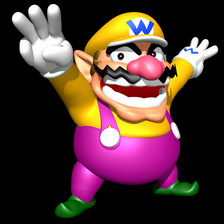
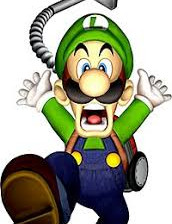
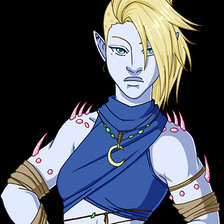
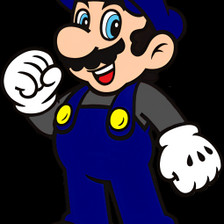
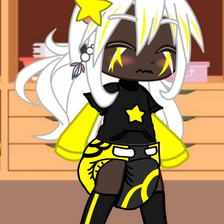
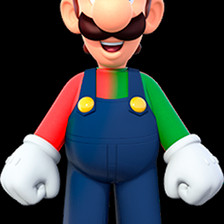
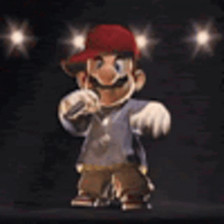
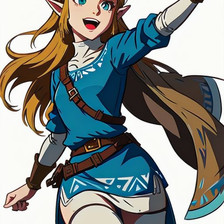
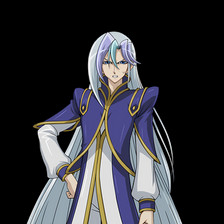
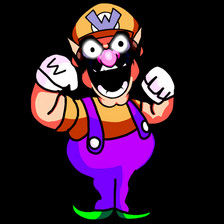

In [496]:
pd.DataFrame(list(labeled_data.iloc[check].idx)).style.format(embed_image)

They are indeed the hard images lol, which makes sense to my eyes. 

<a id="3"></a> 
# Evaluation

<a id="10"></a> 
## Test dataset check

In [8]:
# evaluation code goes here

In [530]:
test_set = pd.read_csv("test_set.csv")
test_set

,index,Mario,Frieren,Lae'zel
0,4134,0.0,0.0,0.0
1,11673,0.0,0.0,0.0
2,42508,0.0,0.0,0.0
3,61900,0.0,0.0,0.0
4,64651,1.0,0.0,0.0
...,...,...,...,...
95,9029,1.0,0.0,0.0
96,55870,0.0,0.0,0.0
97,91829,0.0,0.0,0.0
98,55147,0.0,0.0,0.0


In [531]:
test_set.describe() # There is no Lae'zel in the test set!!

,index,Mario,Frieren,Lae'zel
count,100.000000,100.00000,100.00,100.0
mean,49910.450000,0.08000,0.01,0.0
std,25407.009391,0.27266,0.10,0.0
min,1965.000000,0.00000,0.00,0.0
25%,30875.250000,0.00000,0.00,0.0
50%,48711.000000,0.00000,0.00,0.0
75%,71241.000000,0.00000,0.00,0.0
max,92126.000000,1.00000,1.00,0.0


In [532]:
# Create the fourth label as other
def other_label(row):
    if not row["Mario"] and not row["Frieren"] and not row["Lae'zel"]:
        return 1
    else:
        return 0
    
test_set["other"] = test_set.apply(other_label, axis=1)
test_set.head()

,index,Mario,Frieren,Lae'zel,other
0,4134,0.0,0.0,0.0,1
1,11673,0.0,0.0,0.0,1
2,42508,0.0,0.0,0.0,1
3,61900,0.0,0.0,0.0,1
4,64651,1.0,0.0,0.0,0


In [533]:
# Check each image has one and only one label
check = np.sum(test_set.drop(columns=["index"]), axis=1)
all(v ==1 for v in check)

True

In [534]:
test_set[test_set["Lae'zel"]==1]

,index,Mario,Frieren,Lae'zel,other


,0,1,2,3
0,,,,
1,,,,

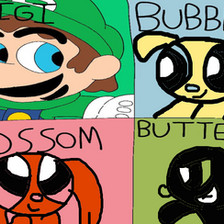
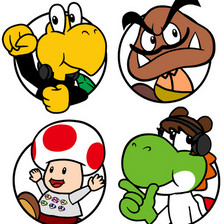
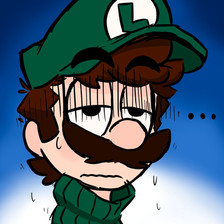
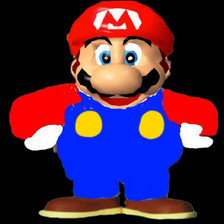
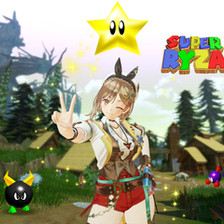
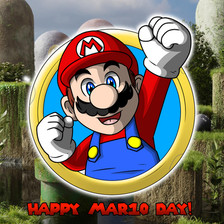
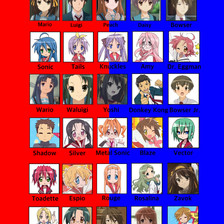
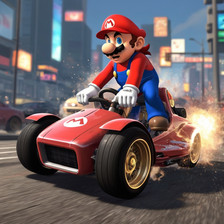

In [542]:
pd.DataFrame(np.array(test_set.query("Mario==1")['index']).reshape(2, 4)).style.format(embed_image)

,0
0,

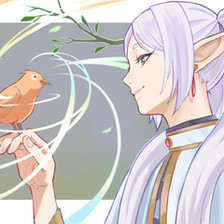

In [541]:
pd.DataFrame(np.array(test_set.query("Frieren==1")['index']).reshape(1,1)).style.format(embed_image)

**Issues**: Based on the check, there are 8 images labeled as "Mario", 1 image labeled as "Frieren" and no image labeled as "Lae'zel". There are even mis-labelling happened. 5/8 images with label "Mario" are not real "Mario". We will need to manually adjust the labels. 


In [508]:
# Note that we already define the labels as {"Mario":0, "Frieren":1, "laezel":2, "other":3}
test_array = [[x, 3] for x in test_set['index']]
new_test_set = pd.DataFrame(data=[[x, 3] for x in test_set['index']], columns=["idx", "label"])

In [551]:
for index in [32, 76, 84, 95]:
    new_test_set.iloc[index][1] = 0 # Mario
new_test_set.iloc[6][1] = 1 #Frieren

In [553]:
new_test_set.label.value_counts()

label
3    95
0     4
1     1
Name: count, dtype: int64

In [564]:
new_test_set.query("label==0").idx

32    29960
76    36931
84    72661
95     9029
Name: idx, dtype: int64

,0
0,
1,
2,
3,

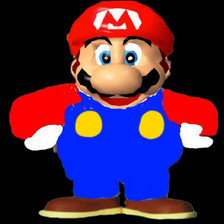
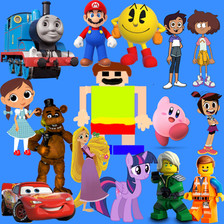
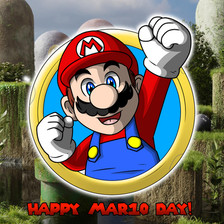
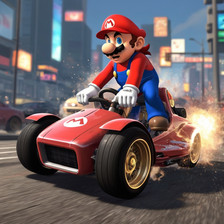

In [565]:
pd.DataFrame(np.array(new_test_set.query("label==0").idx)).style.format(embed_image)

,idx
0,
1,
2,
3,
4,
5,
6,
7,
8,
9,

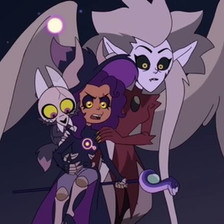
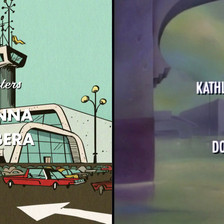
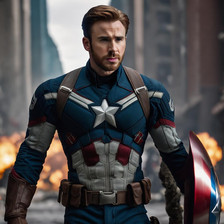
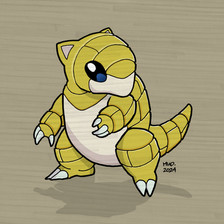
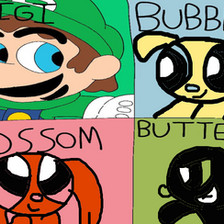
...
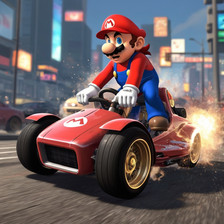
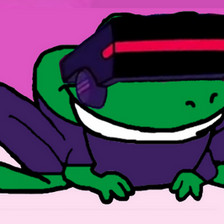
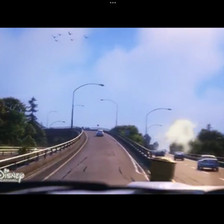
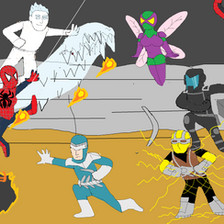
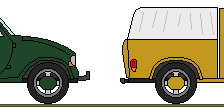

In [513]:
pd.DataFrame(new_test_set.idx).style.format(embed_image)

Yay, now we are ready to do the evaluation!!

<a id="11"></a> 
## Zero shot performance

In [577]:
# Example usage
classifier = CLIPImageClassifier(model_name="ViT-L/14@336px")
image_lists = list(new_test_set.idx)
predictions = classifier.batch_process_images(image_lists)

In [580]:
# Use previously defined evaluation func 
evaluate(new_test_set.label, predictions)

/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'accuracy': 0.86, 'precision': 0.236, 'recall': 0.226, 'f1_score': 0.231}

In [582]:
# For zero shot
report = classification_report(new_test_set.label, predictions)

print(report)

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         4
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         0
           3       0.95      0.91      0.92        95

    accuracy                           0.86       100
   macro avg       0.24      0.23      0.23       100
weighted avg       0.90      0.86      0.88       100



/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,idx
5,
6,
13,
17,
32,
44,
46,
57,
75,
76,

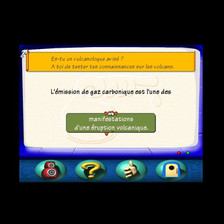
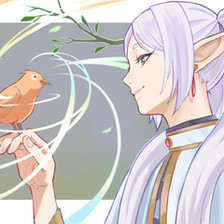
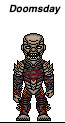
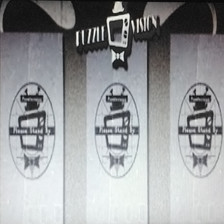
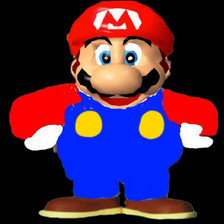
...
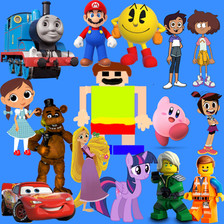
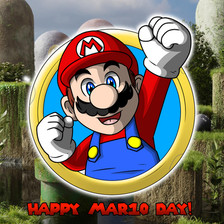
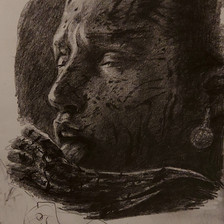
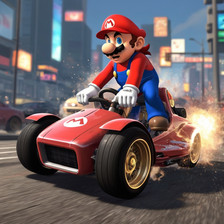
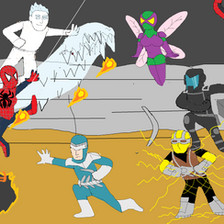

In [686]:
# Visualize the wrongly predicted image for better understanding
new_test_set[new_test_set.label != predictions].idx.to_frame().style.format(embed_image)

<a id="12"></a> 
## Logistic regression performance

In [668]:
features = final_embeddings[np.array(new_test_set.idx)]
features.shape

(100, 512)

In [669]:
# Evaluate using the logistic regression classifier
y_pred = lg_classifier.predict(features)
evl = evaluate(new_test_set.label, y_pred)
print(evl)

{'accuracy': 0.96, 'precision': 0.745, 'recall': 0.62, 'f1_score': 0.661}


/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [670]:
# For logistic regression
report = classification_report(new_test_set.label, y_pred)

print(report)

              precision    recall  f1-score   support

           0       1.00      0.50      0.67         4
           1       1.00      1.00      1.00         1
           2       0.00      0.00      0.00         0
           3       0.98      0.98      0.98        95

    accuracy                           0.96       100
   macro avg       0.74      0.62      0.66       100
weighted avg       0.98      0.96      0.97       100



/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [682]:
new_test_set[new_test_set.label != y_pred]

,idx,label
13,88153,3
76,36931,0
82,52389,3
95,9029,0


In [683]:
y_pred[new_test_set.label != y_pred]

array([2, 3, 2, 3])

,idx
13,
76,
82,
95,

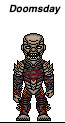
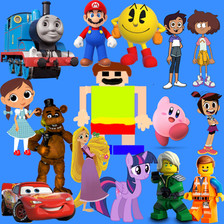
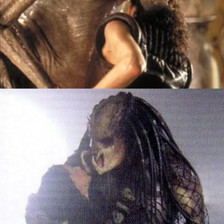
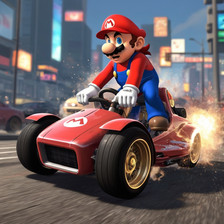

In [679]:
# Visualize the wrongly predicted image for better understanding
new_test_set[new_test_set.label != y_pred].idx.to_frame().style.format(embed_image)

<a id="13"></a> 
## Feed-forward NN performance

<a id="20"></a> 
### One layer model

In [687]:
X_test_tensor = torch.tensor(features)
y_test_tensor = torch.tensor(np.array(new_test_set.label))

test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
test_loader = DataLoader(test_dataset, batch_size=100)

# Evaluate the model
nn_classifier1.eval()

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = nn_classifier1(inputs)
#         print(outputs.shape)
        _, predicted = torch.max(outputs, 1)
        nn_pred1 = predicted.numpy()


In [688]:
evaluate(new_test_set.label, nn_pred1)

/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'accuracy': 0.96, 'precision': 0.685, 'recall': 0.68, 'f1_score': 0.682}

In [689]:
# For FF NN 
report = classification_report(new_test_set.label, nn_pred1)

print(report)

              precision    recall  f1-score   support

           0       0.75      0.75      0.75         4
           1       1.00      1.00      1.00         1
           2       0.00      0.00      0.00         0
           3       0.99      0.97      0.98        95

    accuracy                           0.96       100
   macro avg       0.68      0.68      0.68       100
weighted avg       0.98      0.96      0.97       100



/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/wenjingchu/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [690]:
new_test_set[new_test_set.label != nn_pred1]

,idx,label
13,88153,3
53,92126,3
76,36931,0
82,52389,3


,idx
13,
53,
76,
82,

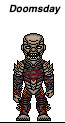
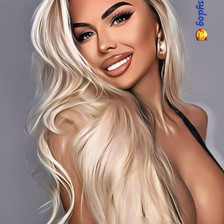
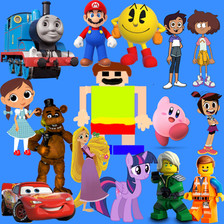
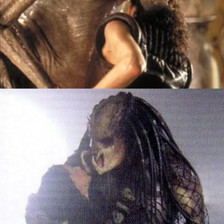

In [691]:
# Visualize the wrongly predicted image for better understanding
new_test_set[new_test_set.label != nn_pred1].idx.to_frame().style.format(embed_image)

<a id="21"></a> 
### Two layer model

In [692]:
X_test_tensor = torch.tensor(features)
y_test_tensor = torch.tensor(np.array(new_test_set.label))

test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
test_loader = DataLoader(test_dataset, batch_size=100)

# Evaluate the model
nn_classifier2.eval()

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = nn_classifier2(inputs)
#         print(outputs.shape)
        _, predicted = torch.max(outputs, 1)
        nn_pred2 = predicted.numpy()


In [693]:
evaluate(new_test_set.label, nn_pred2)

{'accuracy': 0.98, 'precision': 0.913, 'recall': 0.913, 'f1_score': 0.913}

In [694]:
# For FF NN 
report = classification_report(new_test_set.label, nn_pred2)

print(report)

              precision    recall  f1-score   support

           0       0.75      0.75      0.75         4
           1       1.00      1.00      1.00         1
           3       0.99      0.99      0.99        95

    accuracy                           0.98       100
   macro avg       0.91      0.91      0.91       100
weighted avg       0.98      0.98      0.98       100



In [695]:
new_test_set[new_test_set.label != nn_pred2]

,idx,label
53,92126,3
76,36931,0


In [697]:
nn_pred2[new_test_set.label != nn_pred2]

array([0, 3])

,idx
53,
76,

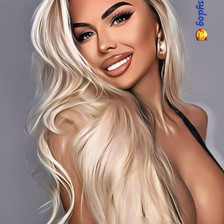
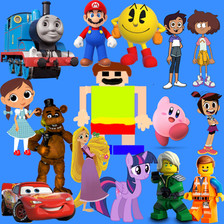

In [696]:
# Visualize the wrongly predicted image for better understanding
new_test_set[new_test_set.label != nn_pred2].idx.to_frame().style.format(embed_image)

<a id="4"></a> 
# Conclusion

The result shows that adding a linear model or a/some NN layer(s) on top of the clip embeddings is indeed important! Among them, for our small test dataset which contains 100 images, the feed forward NN with two additional layers seems better since has better prediction accuracy. However, the comparison may not always be true since the lack of the test dataset. 

Also, be noted that I did almost the same evaluation process in the modelling stage as validation purpose at which we evaluate the model on laezel images as well. It turns out both model can 100% correctly identify laezel so I do not worry a lot about the model prediction power on laezel.  

The things that I believe are important as well:
1. Be specific about the character defination. How do we define whether a image contains a certain character? i.e, will Luigi can be regarded as mario in some scenarios? If a mario-like person wearing green but we could not see the hat colour or the letter "M" OR "L", how should we classify it?
2. how to make sure the rules for groud-truth label are same for all the observers? People's opinion can be different. My and my husband holds various opinion when I select the labels.For example, if a image contains multiple characters but not only mario, shall we calssify it to mario class? 
3. How to have sufficient test data with as high as possible accuracy rate? 

I am indeed excited to complete this assignment and hopefully we could discuss more later on! 
:) 
